# Final Project 

---
**name**: Melissa Chin

**SID**: 50784165

In [1]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
from camutils import Camera, triangulate, makerotation, calibratePose, reconstruct, decode
from meshutils import writeply, mesh_smoothing, generateMesh
import pickle
import visutils
import matplotlib.patches as patches
from mpl_toolkits.mplot3d import Axes3D
import trimesh
import cv2

%matplotlib inline

In [2]:
plt.rcParams['figure.figsize']=[15,15]

---
### Part 1: Get Intrinsic and extrinsic parameters

In [3]:
# load in the intrinsic camera parameters from 'calibration.pickle'
intrinsic_params = np.load('calibration.pickle',allow_pickle=True)
fl = (intrinsic_params['fx'] + intrinsic_params['fy'])/2  # focal length is the average of the two estimated by the script


# create Camera objects representing the left and right cameras
# use the known intrinsic parameters you loaded in.
camL = Camera(f=fl,c=np.array([[intrinsic_params['cx'],intrinsic_params['cy']]]).T,t=np.array([[0,0,0]]).T, R=makerotation(0,0,0))
camR = Camera(f=fl,c=np.array([[intrinsic_params['cx'],intrinsic_params['cy']]]).T,t=np.array([[0,0,0]]).T, R=makerotation(0,0,0))

# now figure out the extrinsic parameters using the first left and right images of calib_jpg_u

imgL = plt.imread('calib_jpg_u/frame_C0_01.jpg')
ret, cornersL = cv2.findChessboardCorners(imgL, (8,6), None)
pts2L = cornersL.squeeze().T

imgR = plt.imread('calib_jpg_u/frame_C1_01.jpg')
ret, cornersR = cv2.findChessboardCorners(imgR, (8,6), None)
pts2R = cornersR.squeeze().T

# generate the known 3D point coordinates of points on the checkerboard in cm
pts3 = np.zeros((3,6*8))
yy,xx = np.meshgrid(np.arange(8),np.arange(6))
pts3[0,:] = 2.8*xx.reshape(1,-1)
pts3[1,:] = 2.8*yy.reshape(1,-1)


# Now use your calibratePose function to get the extrinsic parameters
# for the two images. You may need to experiment with the initialization
# in order to get a good result

paramsL_init = np.array([0,0,0,0,0,-10]) 
paramsR_init = np.array([0,0,0,0,0,-4]) 

camL = calibratePose(pts3,pts2L,camL,paramsL_init)
camR = calibratePose(pts3,pts2R,camR,paramsR_init)

print(camL)
print(camR)



Camera : 
 f=1404.6009650962417 
 c=[[962.16736421 590.91595766]] 
 R=[[ 0.03841918  0.9894839   0.1394474 ]
 [ 0.97736622 -0.0081566  -0.21139714]
 [-0.20803665  0.14441288 -0.96740151]] 
 t = [[ 6.8690127  19.52125995 47.34272427]]
Camera : 
 f=1404.6009650962417 
 c=[[962.16736421 590.91595766]] 
 R=[[-0.00257109  0.99099991  0.13383783]
 [ 0.99278629 -0.01351364  0.1191334 ]
 [ 0.11986982  0.13317867 -0.98381638]] 
 t = [[ 7.51170245  7.21235286 47.7652197 ]]


### Part 2: Modified both reconstruct and decode function

I modified the decode function to create an object mask 

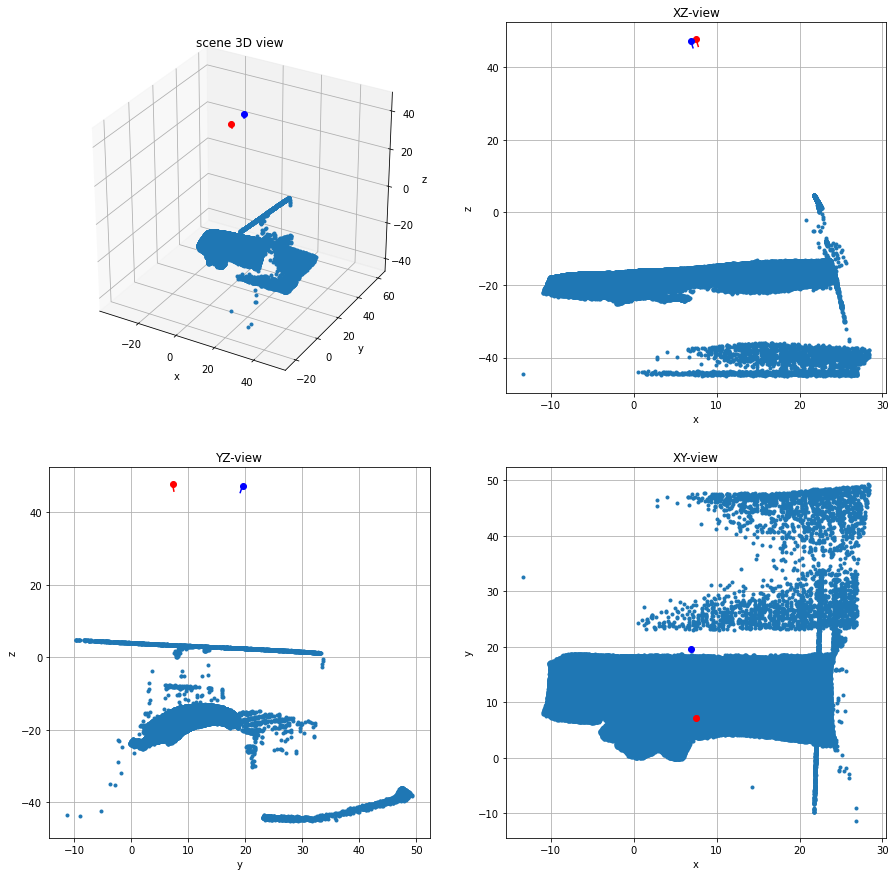

In [8]:
imprefixC0 = 'C:/Users/chinm/CS117/Final Project/grab_3_u/frame_C0_'
imprefixC0C = 'C:/Users/chinm/CS117/Final Project/grab_3_u/color_C0_'
imprefixC1 = 'C:/Users/chinm/CS117/Final Project/grab_3_u/frame_C1_'
imprefixC1C = 'C:/Users/chinm/CS117/Final Project/grab_3_u/color_C1_'
threshold = 0.02

pts2L,pts2R,pts3,color = reconstruct(imprefixC0,imprefixC0C,imprefixC1,imprefixC1C,threshold, camL,camR)

lookL = np.hstack((camL.t,camL.t+camL.R @ np.array([[0,0,2]]).T))
lookR = np.hstack((camR.t,camR.t+camR.R @ np.array([[0,0,2]]).T))

# visualize the left and right image overlaid
fig = plt.figure()
ax = fig.add_subplot(2,2,1,projection='3d')
ax.plot(pts3[0,:],pts3[1,:],pts3[2,:],'.')
ax.plot(camR.t[0],camR.t[1],camR.t[2],'ro')
ax.plot(camL.t[0],camL.t[1],camL.t[2],'bo')
ax.plot(lookL[0,:],lookL[1,:],lookL[2,:],'b')
ax.plot(lookR[0,:],lookR[1,:],lookR[2,:],'r')
visutils.set_axes_equal_3d(ax)
visutils.label_axes(ax)
plt.title('scene 3D view')

ax = fig.add_subplot(2,2,2)
ax.plot(pts3[0,:],pts3[2,:],'.')
ax.plot(camR.t[0],camR.t[2],'ro')
ax.plot(camL.t[0],camL.t[2],'bo')
ax.plot(lookL[0,:],lookL[2,:],'b')
ax.plot(lookR[0,:],lookR[2,:],'r')
plt.title('XZ-view')
plt.grid()
plt.xlabel('x')
plt.ylabel('z')

ax = fig.add_subplot(2,2,3)
ax.plot(pts3[1,:],pts3[2,:],'.')
ax.plot(camR.t[1],camR.t[2],'ro')
ax.plot(camL.t[1],camL.t[2],'bo')
ax.plot(lookL[1,:],lookL[2,:],'b')
ax.plot(lookR[1,:],lookR[2,:],'r')
plt.title('YZ-view')
plt.grid()
plt.xlabel('y')
plt.ylabel('z')

ax = fig.add_subplot(2,2,4)
ax.plot(pts3[0,:],pts3[1,:],'.')
ax.plot(camR.t[0],camR.t[1],'ro')
ax.plot(camL.t[0],camL.t[1],'bo')
ax.plot(lookL[0,:],lookL[1,:],'b')
ax.plot(lookR[0,:],lookR[1,:],'r')
plt.title('XY-view')
plt.grid()
plt.xlabel('x')
plt.ylabel('y')
plt.show()



In [49]:
boxlimits = np.array([-15,24,0,22,-26,-15])
trithresh = 1.7

drop_pts = []
for i in range(pts3.shape[1]):
    if(not((boxlimits[0] < pts3[0][i] < boxlimits[1]) and (boxlimits[2] < pts3[1][i] < boxlimits[3]) and (boxlimits[4] < pts3[2][i] < boxlimits[5]))):
        drop_pts.append(i)

pts3s = np.delete(pts3, drop_pts, 1)
pts2Ls = np.delete(pts2L, drop_pts, 1)
pts2Rs = np.delete(pts2R, drop_pts, 1)
colors = np.delete(color, drop_pts, 1)


#triangle pruning + removing points with no triangles
trans_pts3 = pts3s.T

#for pts2L first 
triL = scipy.spatial.Delaunay(pts2Ls.T)
drop_simplicesL = []

#iterate through all the triangles and store the triangles that have edges whose length is longer than trithresh

for j in range(triL.simplices.shape[0]):
    point1 = trans_pts3[triL.simplices[j][0]]
    point2 = trans_pts3[triL.simplices[j][1]]
    point3 = trans_pts3[triL.simplices[j][2]]
    if((np.linalg.norm(point1 - point2) > trithresh) or (np.linalg.norm(point2 - point3) > trithresh) or (np.linalg.norm(point1 - point3) > trithresh)):
        drop_simplicesL.append(j)

# now delete those triangles
triL.simplices = np.delete(triL.simplices, drop_simplicesL, 0)

#remapping the indicies of the triangles before we delete the 3d points
tokeep = np.unique(triL.simplices.flatten())
remapping = np.zeros(pts3s.shape[1])
remapping[tokeep] = np.arange(0,tokeep.shape[0])
triL.simplices = remapping[triL.simplices]

# remove any points which are not refenced in any triangle
pts3s = pts3s[:,tokeep]
colors = colors[:,tokeep]


This is me displaying the mesh to see if it looks good with the cleanup parameters given. If not, I adjust the parameters accordingly.

In [9]:
mesh = trimesh.Trimesh(vertices=pts3s.T,faces=tri.simplices[:,[0,2,1]])
mesh.show()

In [4]:
#### create all the meshes for each of the scans

threshold = 0.02
# first one 
directory = "C:/Users/chinm/CS117/Final Project/grab_0_u"
first_mesh = "firstmesh.pickle"
first_boxlimits = np.array([-15,24,0,22,-26,-15])
first_trithresh =  1.7
generateMesh(directory, threshold,camL,camR,first_boxlimits,first_trithresh,first_mesh)

#second one
directory = "C:/Users/chinm/CS117/Final Project/grab_1_u"
second_mesh = "secondmesh.pickle"
second_boxlimits = np.array([-15,25,5,18,-26,-10])
second_trithresh = 1.3
generateMesh(directory, threshold,camL,camR,second_boxlimits,second_trithresh,second_mesh)

#third one
directory = "C:/Users/chinm/CS117/Final Project/grab_2_u"
third_mesh = "thirdmesh.pickle"
third_boxlimits = np.array([-12,25,5,18,-26,-10])
third_trithresh = 3.1
generateMesh(directory, threshold,camL,camR,third_boxlimits,third_trithresh,third_mesh)

#fourth one
directory = "C:/Users/chinm/CS117/Final Project/grab_3_u"
fourth_mesh = "fourthmesh.pickle"
fourth_boxlimits = np.array([-12,24,-1,19,-26,-13])
fourth_trithresh = 1.4
generateMesh(directory, threshold,camL,camR,fourth_boxlimits,fourth_trithresh,fourth_mesh)

#fifth one
directory = "C:/Users/chinm/CS117/Final Project/grab_4_u"
fifth_mesh = "fifthmesh.pickle"
fifth_boxlimits = np.array([-10,24,7,18,-20,-10])
fifth_trithresh = 3
generateMesh(directory, threshold,camL,camR,fifth_boxlimits,fifth_trithresh,fifth_mesh)

#sixth one
directory = "C:/Users/chinm/CS117/Final Project/grab_5_u"
sixth_mesh = "sixthmesh.pickle"
sixth_boxlimits = np.array([14,23,-7,19,-38,-5])
sixth_trithresh = 3.2
generateMesh(directory, threshold,camL,camR,sixth_boxlimits,sixth_trithresh,sixth_mesh)


### Part 4: Mesh Smoothing

I created a function called *mesh_smoothing* that takes in the mesh pickle file and the number of iterations to run the smoothing process. To smooth my mesh, I computed for each 3D point the average location of that points neighbors in the mesh and replace the point's coordinates with this average. 

In [11]:
mesh_smoothing('firstmesh.pickle', 3)
mesh_smoothing('secondmesh.pickle', 3)
mesh_smoothing('thirdmesh.pickle', 3)
mesh_smoothing('fourthmesh.pickle', 3)
mesh_smoothing('fifthmesh.pickle', 3)
mesh_smoothing('sixthmesh.pickle', 3)

This is me checking whether the mesh looked smooth or not.

In [13]:
firstmesh = np.load('fourthmesh.pickle',allow_pickle=True)
pts3 = firstmesh["pts3"]
tri = firstmesh["tri"]

mesh = trimesh.Trimesh(vertices=pts3.T,faces=tri[:,[0,2,1]])
mesh.show()

### Part 5: Aligning multiple meshes

I'm going to first compile all the mesh pickle files into .ply files, so I can load them into Meshlab to align them.

In [93]:
list_mesh = ['firstmesh','secondmesh','thirdmesh','fourthmesh','fifthmesh','sixthmesh']
for mesh_file in list_mesh:
    mesh = np.load("{}.pickle".format(mesh_file),allow_pickle=True)
    pts3 = mesh["pts3"]
    tri = mesh["tri"]
    color = mesh["color"]
    writeply(pts3,color,tri,"{}.ply".format(mesh_file))